This code is referenced from <br>
https://github.com/TannerGilbert/Object-Detection-and-Image-Segmentation-with-Detectron2

In [1]:
%cd detectron2

/home/test/carasml/detection/d2_FasterRCNN/detectron2


/home/test/.local/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


# Download a demo dataset

Before we can start training our model we need to download our data-set. <br>
Our script should have automatically downloaded for you  <br>
In case you cannot find it in detectron2/dataset/ <br>
you can download in  <br>
https://www.kaggle.com/datasets/tannergi/chess-piece-detection

In [2]:
import torch
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.evaluation import COCOEvaluator

## Register data-set

In [3]:
# write a function that loads the dataset into detectron2's standard format
# if your dataset is not in the same format, you need to revise the code of this part
import os
import numpy as np
import json
from detectron2.structures import BoxMode
import itertools
import cv2
import xml.etree.ElementTree as ET
import random

# write a function that loads the dataset into detectron2's standard format
def get_dataset_dicts(annotation_path, image_path):
    classes = ['white-rook', 'white-knight', 'white-bishop', 'white-king', 'white-queen', 'white-pawn', 'black-rook', 'black-knight', 'black-bishop', 'black-king', 'black-queen', 'black-pawn']
    # read the xml
    dataset_dicts = []
    for idx, filename in enumerate(os.listdir(annotation_path)):
        record = {}
        root = ET.parse(os.path.join(annotation_path, filename)).getroot()
        record["file_name"] = os.path.join(image_path, root.find('filename').text)
        record["height"] = 2248
        record["width"] = 4000
        record["image_id"] = idx  # Add image_id for evaluation
        objs = []
        for member in root.findall('object'):
          obj = {
              'bbox': [int(member[4][0].text), int(member[4][1].text), int(member[4][2].text), int(member[4][3].text)],
              'bbox_mode': BoxMode.XYXY_ABS,
              'category_id': classes.index(member[0].text),
              "iscrowd": 0
          }
          objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

def split_dataset(dataset_dicts, train_ratio=0.8, seed=42):
    """Split dataset into train and validation sets"""
    random.seed(seed)
    dataset_copy = dataset_dicts.copy()
    random.shuffle(dataset_copy)
    
    split_idx = int(len(dataset_copy) * train_ratio)
    train_dataset = dataset_copy[:split_idx]
    val_dataset = dataset_copy[split_idx:]
    
    return train_dataset, val_dataset

# Custom trainer to build evaluator for validation
class ChessTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            output_folder = os.path.join(cfg.OUTPUT_DIR, "inference")
        return COCOEvaluator(dataset_name, output_dir=output_folder)

# Load and split dataset
print("Loading dataset...")
full_dataset = get_dataset_dicts('./dataset/Chess Detection/annotations', './dataset/Chess Detection/images')
train_dataset, val_dataset = split_dataset(full_dataset, train_ratio=0.8)

print(f"Total samples: {len(full_dataset)}")
print(f"Training samples: {len(train_dataset)}")
print(f"Validation samples: {len(val_dataset)}")

Loading dataset...
Total samples: 81
Training samples: 64
Validation samples: 17


In [4]:
# Register datasets
classes = ['white-rook', 'white-knight', 'white-bishop', 'white-king', 'white-queen', 'white-pawn', 'black-rook', 'black-knight', 'black-bishop', 'black-king', 'black-queen', 'black-pawn']

DatasetCatalog.register('chess_piece_train', lambda: train_dataset)
DatasetCatalog.register('chess_piece_val', lambda: val_dataset)

MetadataCatalog.get('chess_piece_train').set(thing_classes=classes)
MetadataCatalog.get('chess_piece_val').set(thing_classes=classes)

chess_metadata = MetadataCatalog.get('chess_piece_train')

We can check if our code works correctly by plotting a few images.

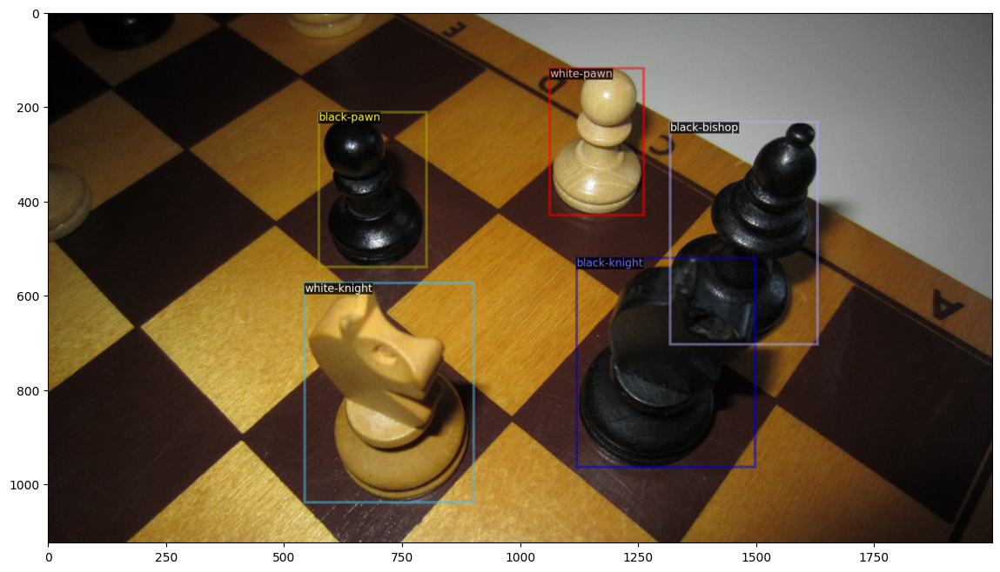

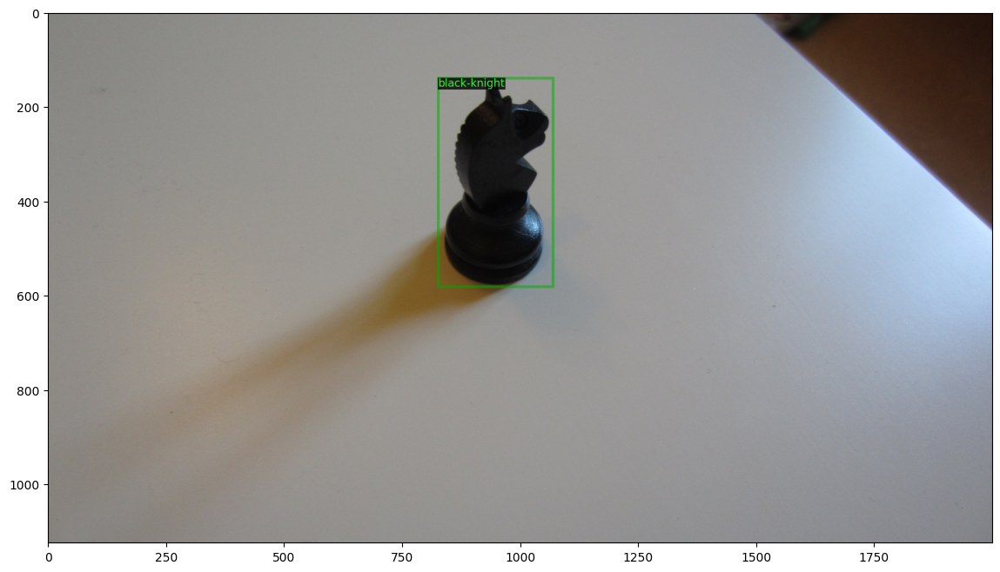

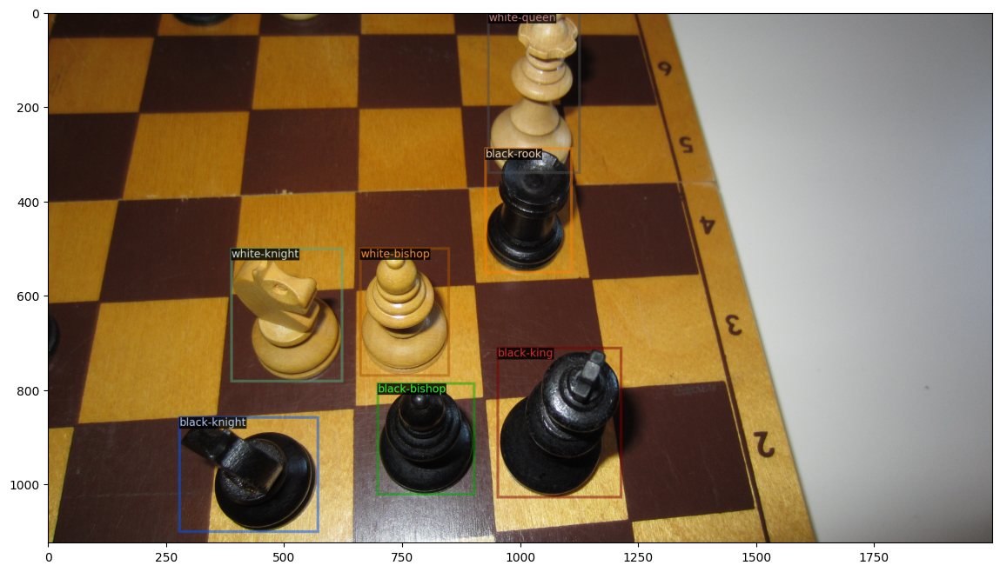

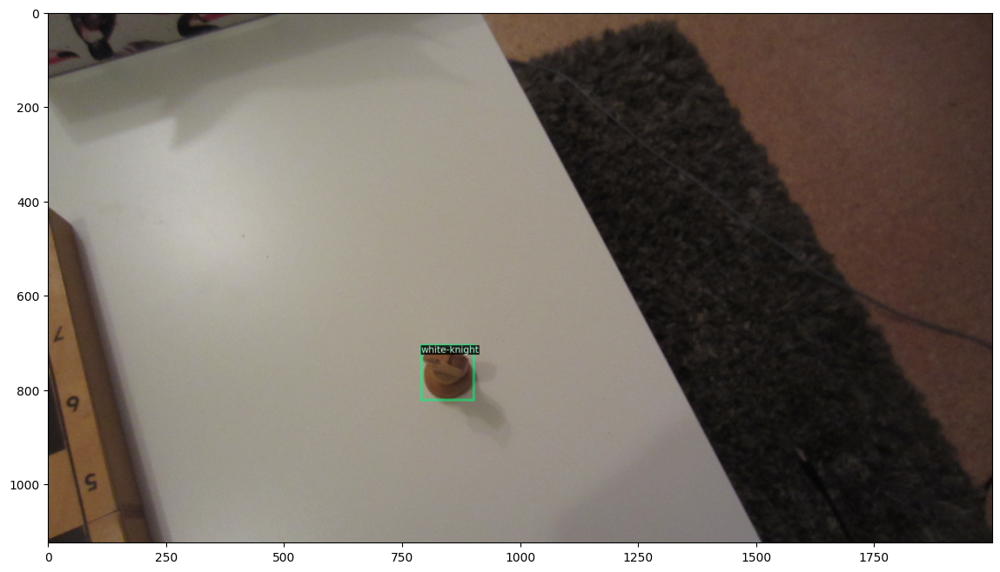

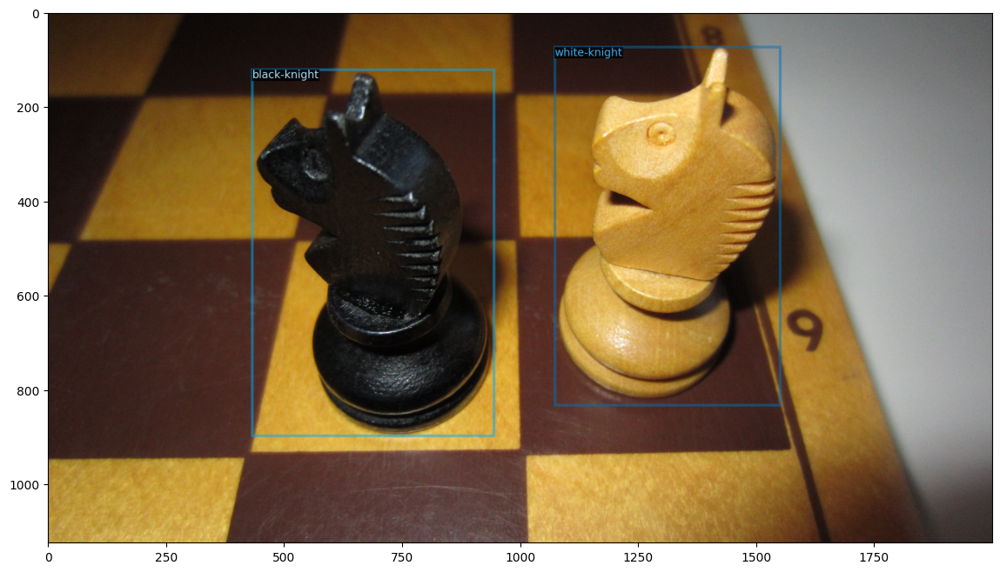

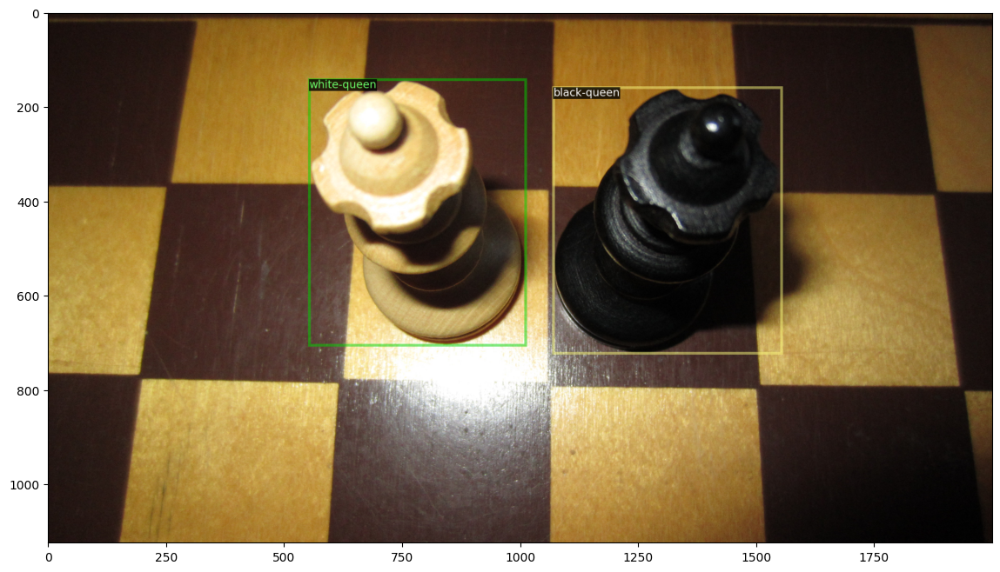

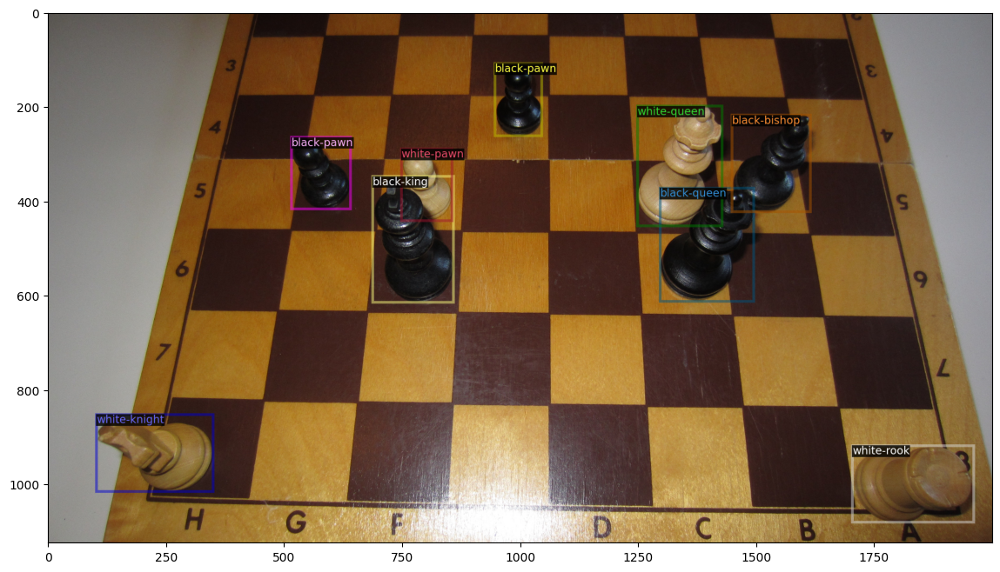

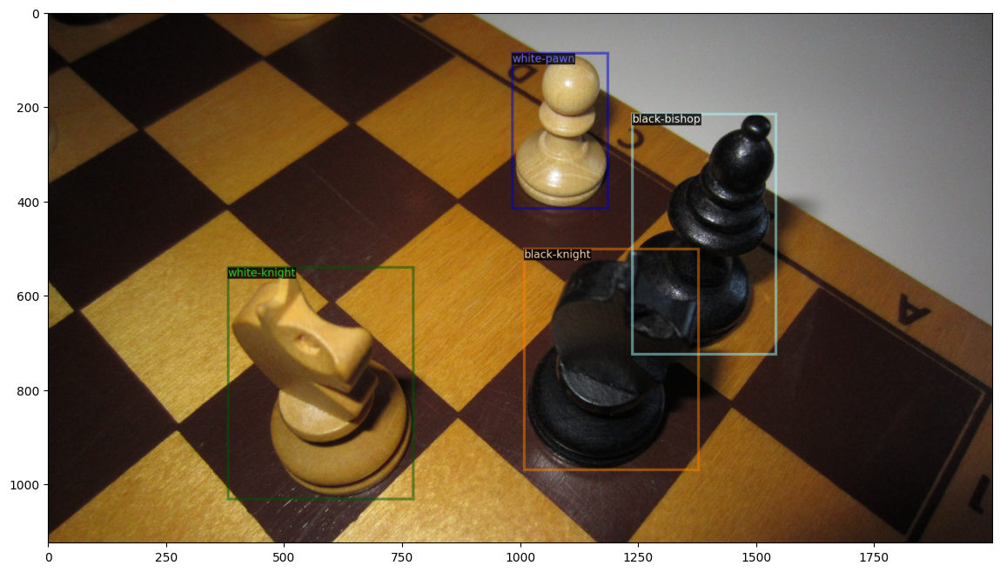

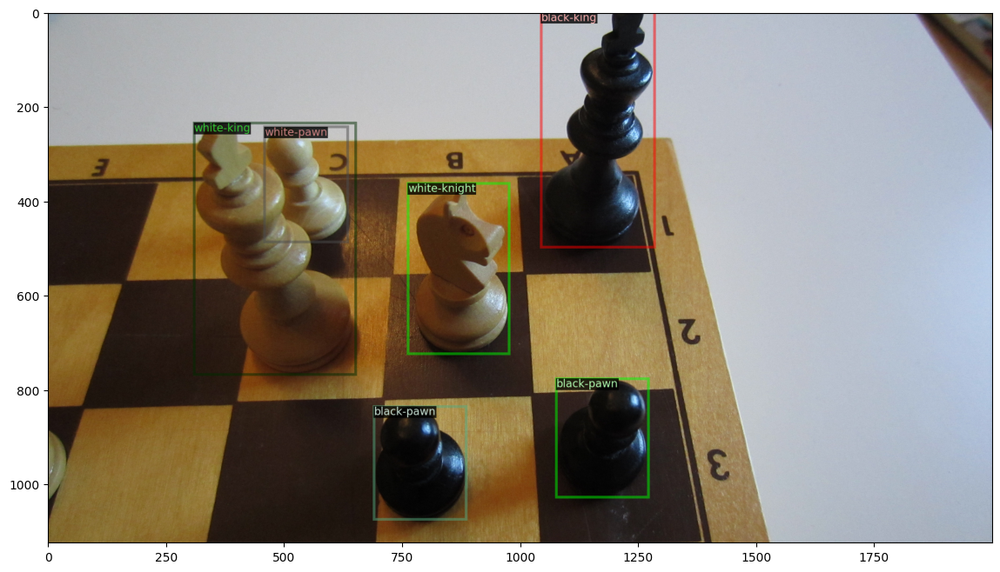

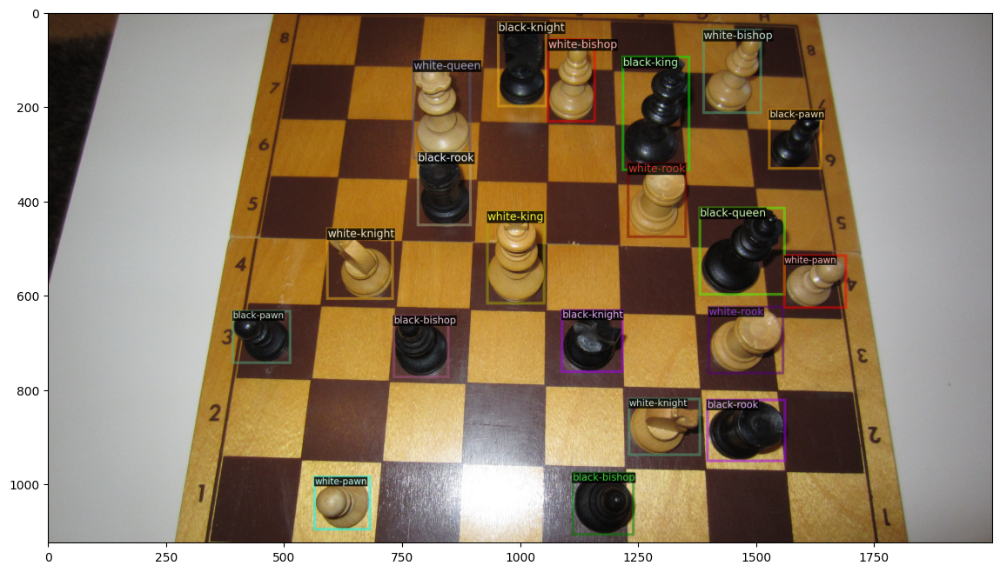

In [5]:
from detectron2.utils.visualizer import Visualizer
import matplotlib.pyplot as plt

dataset_dicts = DatasetCatalog.get('chess_piece_train')
for d in random.sample(dataset_dicts, 10):
    img = cv2.imread(d["file_name"])
    v = Visualizer(img[:, :, ::-1], metadata=chess_metadata, scale=0.5)
    v = v.draw_dataset_dict(d)
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

## Train model

In [12]:
# Configuration
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
print(cfg)

CUDNN_BENCHMARK: False
DATALOADER:
  ASPECT_RATIO_GROUPING: True
  FILTER_EMPTY_ANNOTATIONS: True
  NUM_WORKERS: 4
  REPEAT_SQRT: True
  REPEAT_THRESHOLD: 0.0
  SAMPLER_TRAIN: TrainingSampler
DATASETS:
  PRECOMPUTED_PROPOSAL_TOPK_TEST: 1000
  PRECOMPUTED_PROPOSAL_TOPK_TRAIN: 2000
  PROPOSAL_FILES_TEST: ()
  PROPOSAL_FILES_TRAIN: ()
  TEST: ('coco_2017_val',)
  TRAIN: ('coco_2017_train',)
FLOAT32_PRECISION: 
GLOBAL:
  HACK: 1.0
INPUT:
  CROP:
    ENABLED: False
    SIZE: [0.9, 0.9]
    TYPE: relative_range
  FORMAT: BGR
  MASK_FORMAT: polygon
  MAX_SIZE_TEST: 1333
  MAX_SIZE_TRAIN: 1333
  MIN_SIZE_TEST: 800
  MIN_SIZE_TRAIN: (640, 672, 704, 736, 768, 800)
  MIN_SIZE_TRAIN_SAMPLING: choice
  RANDOM_FLIP: horizontal
MODEL:
  ANCHOR_GENERATOR:
    ANGLES: [[-90, 0, 90]]
    ASPECT_RATIOS: [[0.5, 1.0, 2.0]]
    NAME: DefaultAnchorGenerator
    OFFSET: 0.0
    SIZES: [[32], [64], [128], [256], [512]]
  BACKBONE:
    FREEZE_AT: 2
    NAME: build_resnet_fpn_backbone
  DEVICE: cuda
  FPN:
    F

In [13]:
# Configuration
cfg.DATASETS.TRAIN = ('chess_piece_train',)
cfg.DATASETS.TEST = ('chess_piece_val',)  # Set validation dataset
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.MAX_ITER = 1000
cfg.SOLVER.STEPS = [600,800]   
cfg.SOLVER.WARMUP_ITERS = 100
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 12 #12 classes

# Validation settings
cfg.TEST.EVAL_PERIOD = 100  # Evaluate every 100 iterations
cfg.SOLVER.CHECKPOINT_PERIOD = 100  # Save checkpoint every 100 iterations

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# Train with built-in validation
trainer = ChessTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[07/02 09:54:37 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (13, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (13,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (48, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (48,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias

[07/02 09:54:37 d2.engine.train_loop]: Starting training from iteration 0
[07/02 09:54:40 d2.utils.events]:  eta: 0:02:13  iter: 19  total_loss: 1.351  loss_cls: 0.774  loss_box_reg: 0.5073  loss_rpn_cls: 0.001937  loss_rpn_loc: 0.01239    time: 0.1357  last_time: 0.1354  data_time: 0.0720  last_data_time: 0.0574   lr: 0.0038162  max_mem: 5066M
[07/02 09:54:43 d2.utils.events]:  eta: 0:02:10  iter: 39  total_loss: 1.089  loss_cls: 0.4798  loss_box_reg: 0.5905  loss_rpn_cls: 0.003635  loss_rpn_loc: 0.01271    time: 0.1354  last_time: 0.1515  data_time: 0.0599  last_data_time: 0.0735   lr: 0.0078122  max_mem: 5068M
[07/02 09:54:46 d2.utils.events]:  eta: 0:02:08  iter: 59  total_loss: 0.8335  loss_cls: 0.4238  loss_box_reg: 0.3561  loss_rpn_cls: 0.002069  loss_rpn_loc: 0.02493    time: 0.1362  last_time: 0.1391  data_time: 0.0624  last_data_time: 0.0611   lr: 0.011808  max_mem: 5069M
[07/02 09:54:48 d2.utils.events]:  eta: 0:02:05  iter: 79  total_loss: 0.6844  loss_cls: 0.4481  loss_box

In [14]:
import torch
#after training/testing, clear cache
torch.cuda.empty_cache()
torch.cuda.synchronize()

## Use model for inference

Now, we can perform inference on our validation set by creating a predictor object.

In [15]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
cfg.DATASETS.TEST = ("chess_piece_val", )
predictor = DefaultPredictor(cfg)

[07/02 09:59:02 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


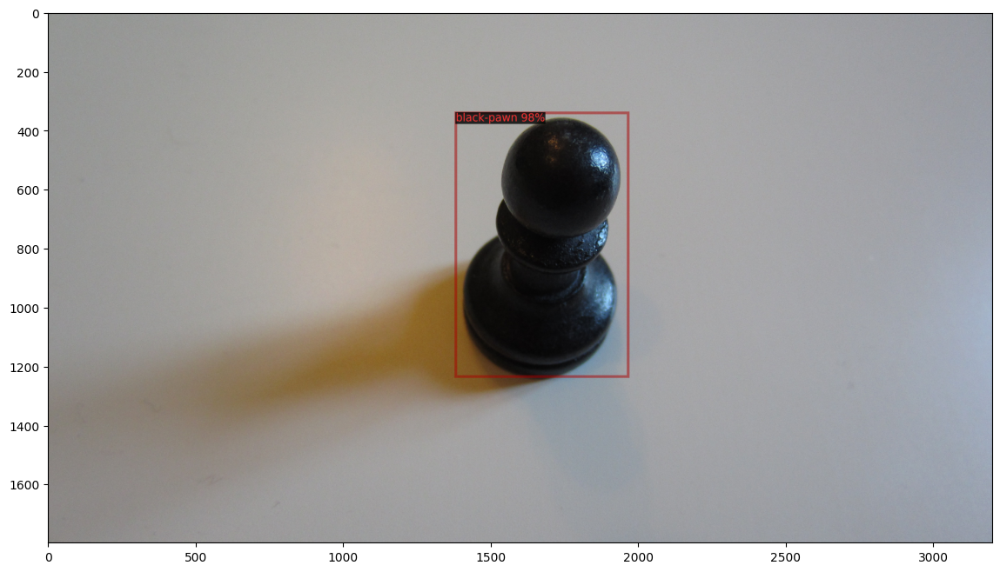

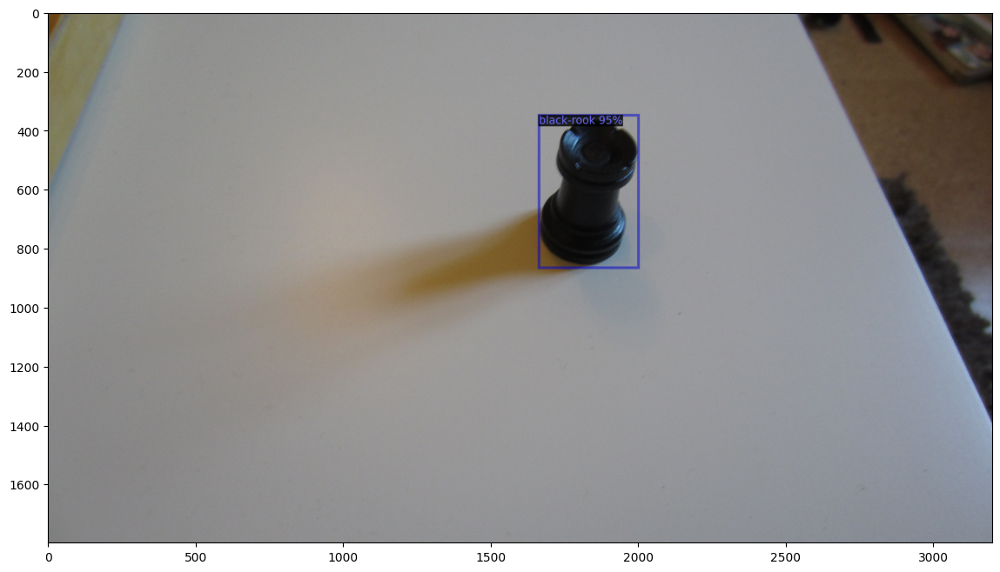

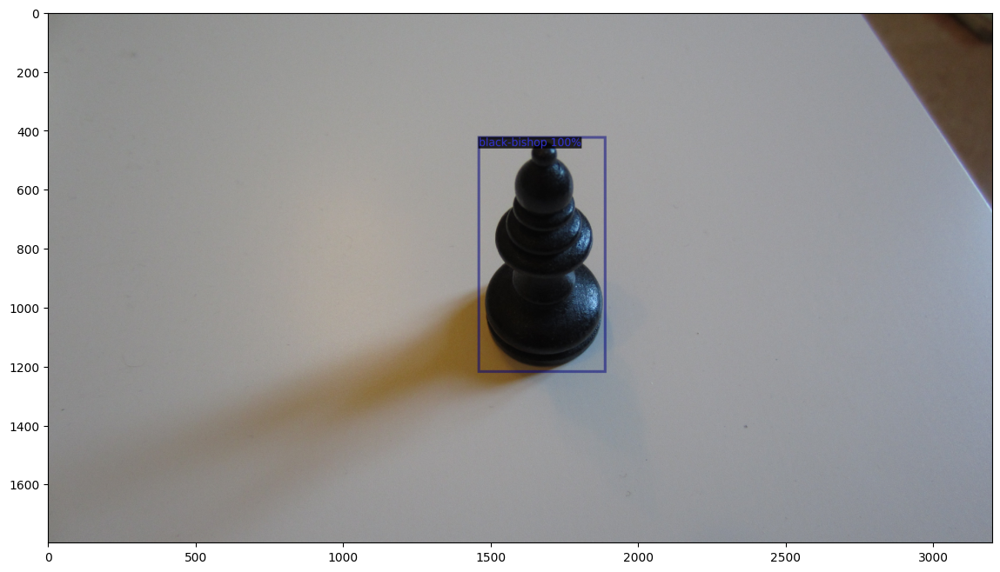

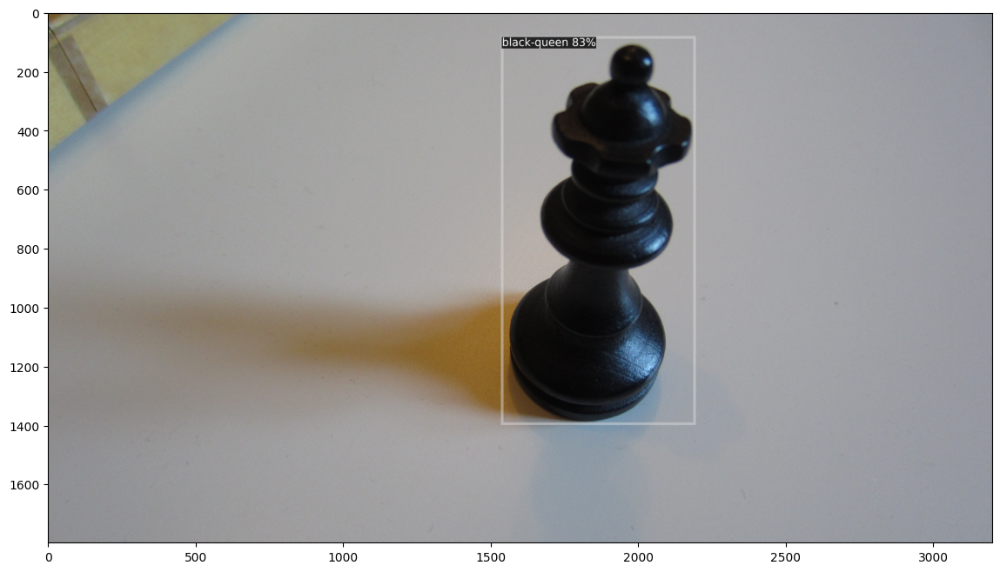

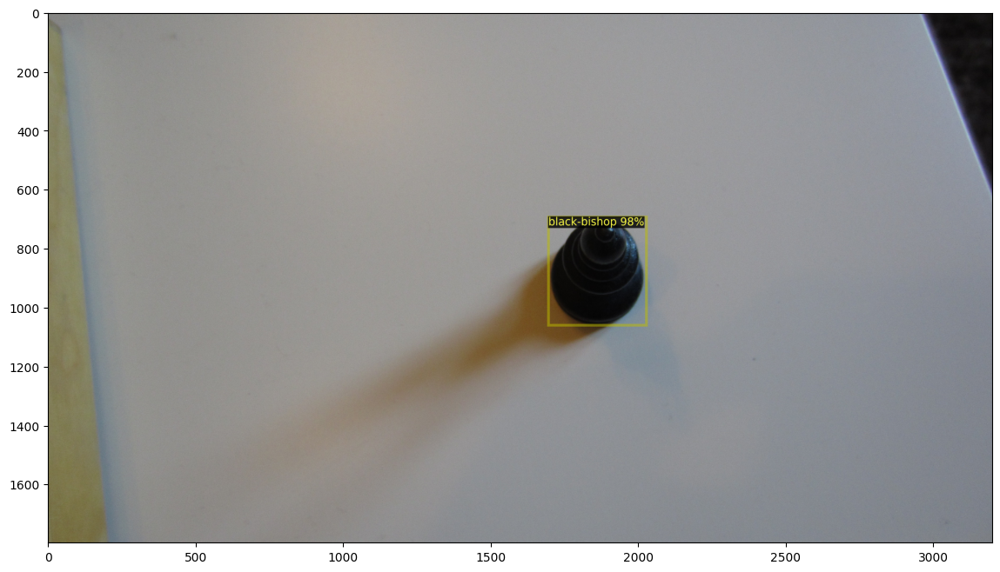

In [16]:
from detectron2.utils.visualizer import ColorMode
import random

dataset_dicts = DatasetCatalog.get('chess_piece_val')
for d in random.sample(dataset_dicts, 5):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], metadata=chess_metadata, scale=0.8)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()